This notebook is for testing pandas/meetjestad/data analysis/etc.

## From: https://www.dataquest.io/blog/tutorial-time-series-analysis-with-pandas/

In [1]:
import pandas as pd
pd.to_datetime('2018-01-15 3:45pm')
pd.to_datetime('7/8/1952')
pd.to_datetime('7/8/1952', dayfirst=True)
pd.to_datetime(['2018-01-05', '7/8/1952', 'Oct 10, 1995'])
pd.to_datetime(['2/25/10', '8/6/17', '12/15/12'], format='%m/%d/%y')
## https://jakevdp.github.io/PythonDataScienceHandbook/03.11-working-with-time-series.html
opsd_daily = pd.read_csv('opsd_germany_daily.csv')
opsd_daily.shape 
opsd_daily.head(3)
opsd_daily.tail(3)
opsd_daily.dtypes
opsd_daily = opsd_daily.set_index('Date')
opsd_daily.head(3)
opsd_daily.index

opsd_daily = pd.read_csv('opsd_germany_daily.csv', index_col=0, parse_dates=True)
opsd_daily

,Consumption,Wind,Solar,Wind+Solar
Date,,,,
2006-01-01,1069.18400,NaN,NaN,NaN
2006-01-02,1380.52100,NaN,NaN,NaN
2006-01-03,1442.53300,NaN,NaN,NaN
2006-01-04,1457.21700,NaN,NaN,NaN
2006-01-05,1477.13100,NaN,NaN,NaN
2006-01-06,1403.42700,NaN,NaN,NaN
2006-01-07,1300.28700,NaN,NaN,NaN
2006-01-08,1207.98500,NaN,NaN,NaN
2006-01-09,1529.32300,NaN,NaN,NaN


In [2]:
dir(opsd_daily.index)


['T',
 '__abs__',
 '__add__',
 '__and__',
 '__array__',
 '__array_priority__',
 '__array_wrap__',
 '__bool__',
 '__bytes__',
 '__class__',
 '__contains__',
 '__copy__',
 '__deepcopy__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__divmod__',
 '__doc__',
 '__eq__',
 '__floordiv__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__init__',
 '__init_subclass__',
 '__inv__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__mod__',
 '__module__',
 '__mul__',
 '__ne__',
 '__neg__',
 '__new__',
 '__nonzero__',
 '__or__',
 '__pos__',
 '__pow__',
 '__radd__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__rfloordiv__',
 '__rmul__',
 '__rpow__',
 '__rsub__',
 '__rtruediv__',
 '__setattr__',
 '__setitem__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__sub__',
 '__subclasshook__',
 '__truediv__',
 '__unicode__',
 '__weakref__',
 '__xor__',
 '_accessors',
 '_add_arithmetic_ops',
 '_add_comparison_methods',
 '_add_comparison_ops',
 '_add

In [3]:
type(opsd_daily)

pandas.core.frame.DataFrame

In [4]:
type(opsd_daily.index)

pandas.core.indexes.datetimes.DatetimeIndex

In [5]:
# Add columns with year, month, and weekday name
opsd_daily['Year'] = opsd_daily.index.year
opsd_daily['Month'] = opsd_daily.index.month
#opsd_daily['Weekday Name'] = opsd_daily.index.weekday_name
opsd_daily['Weekday Name'] = opsd_daily.index.day_name()
# Display a random sampling of 5 rows
opsd_daily.sample(5, random_state=0)

opsd_daily.loc['2017-08-10']
opsd_daily.loc['2014-01-20':'2014-01-22']
opsd_daily.loc['2012-02']



,Consumption,Wind,Solar,Wind+Solar,Year,Month,Weekday Name
Date,,,,,,,
2012-02-01,1511.866,199.607,43.502,243.109,2012,2,Wednesday
2012-02-02,1563.407,73.469,44.675,118.144,2012,2,Thursday
2012-02-03,1563.631,36.352,46.510,82.862,2012,2,Friday
2012-02-04,1372.614,20.551,45.225,65.776,2012,2,Saturday
2012-02-05,1279.432,55.522,54.572,110.094,2012,2,Sunday
2012-02-06,1574.766,34.896,55.389,90.285,2012,2,Monday
2012-02-07,1615.078,100.312,19.867,120.179,2012,2,Tuesday
2012-02-08,1613.774,93.763,36.930,130.693,2012,2,Wednesday
2012-02-09,1591.532,132.219,19.042,151.261,2012,2,Thursday


In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(11, 4)})
opsd_daily['Consumption'].plot(linewidth=0.5);

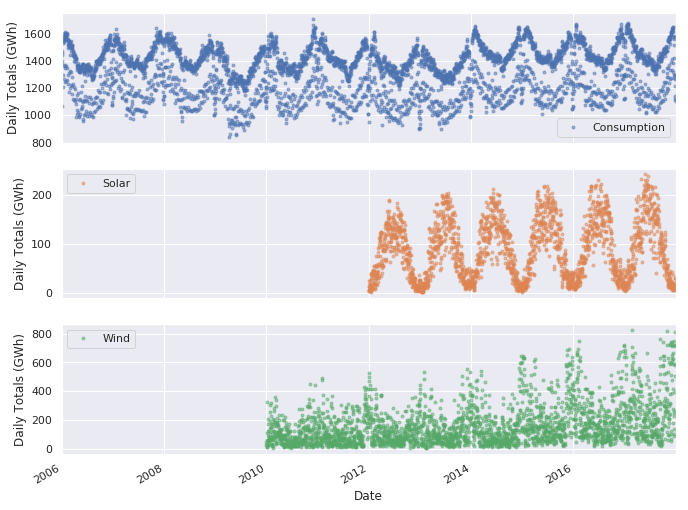

In [7]:
cols_plot = ['Consumption', 'Solar', 'Wind']
axes = opsd_daily[cols_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Daily Totals (GWh)')

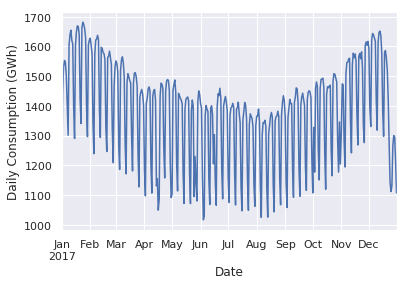

In [8]:
ax = opsd_daily.loc['2017', 'Consumption'].plot()
ax.set_ylabel('Daily Consumption (GWh)');

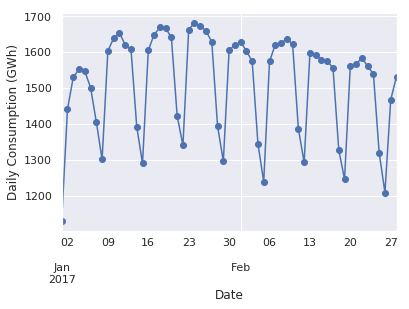

In [9]:
ax = opsd_daily.loc['2017-01':'2017-02', 'Consumption'].plot(marker='o', linestyle='-')
ax.set_ylabel('Daily Consumption (GWh)');

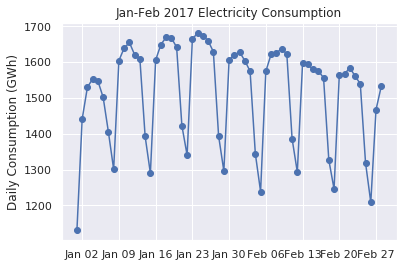

In [10]:
import matplotlib.dates as mdates
fig, ax = plt.subplots()
ax.plot(opsd_daily.loc['2017-01':'2017-02', 'Consumption'], marker='o', linestyle='-')
ax.set_ylabel('Daily Consumption (GWh)')
ax.set_title('Jan-Feb 2017 Electricity Consumption')
# Set x-axis major ticks to weekly interval, on Mondays
ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY))
# Format x-tick labels as 3-letter month name and day number
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'));

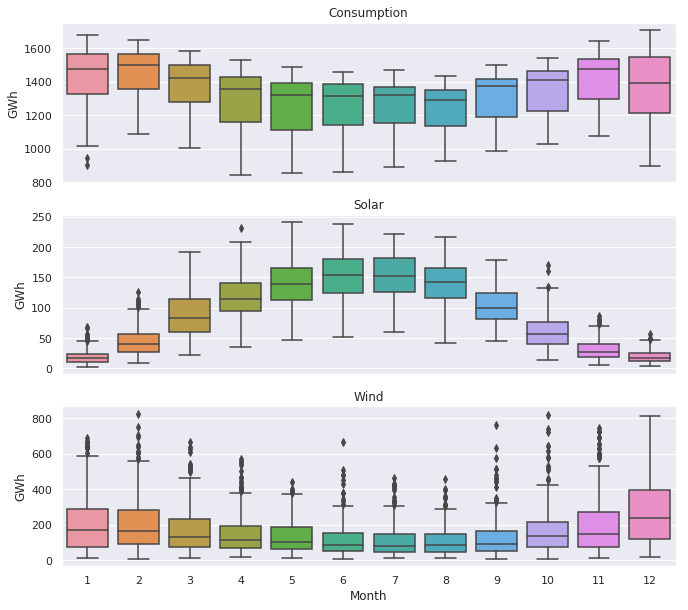

In [11]:
fig, axes = plt.subplots(3, 1, figsize=(11, 10), sharex=True)
for name, ax in zip(['Consumption', 'Solar', 'Wind'], axes):
  sns.boxplot(data=opsd_daily, x='Month', y=name, ax=ax)
  ax.set_ylabel('GWh')
  ax.set_title(name)
  # Remove the automatic x-axis label from all but the bottom subplot
  if ax != axes[-1]:
    ax.set_xlabel('')

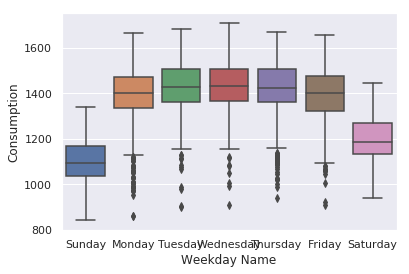

In [12]:
sns.boxplot(data=opsd_daily, x='Weekday Name', y='Consumption');

## From: https://www.datasciencemadesimple.com/get-day-of-week-pandas-python-2/
Trying to solve missing 'weekday_name' --> use day_name()

In [13]:
import pandas as pd
import numpy as np
import datetime
date1 = pd.Series(pd.date_range('2012-1-1 12:00:00', periods=7, freq='M'))
df = pd.DataFrame(dict(date_given=date1))
print(df)

           date_given
0 2012-01-31 12:00:00
1 2012-02-29 12:00:00
2 2012-03-31 12:00:00
3 2012-04-30 12:00:00
4 2012-05-31 12:00:00
5 2012-06-30 12:00:00
6 2012-07-31 12:00:00


In [14]:
#df['day_of_week'] = df['date_given'].dt.weekday_name
df['day_of_week'] = df['date_given'].dt.day_name()
print(df)

           date_given day_of_week
0 2012-01-31 12:00:00     Tuesday
1 2012-02-29 12:00:00   Wednesday
2 2012-03-31 12:00:00    Saturday
3 2012-04-30 12:00:00      Monday
4 2012-05-31 12:00:00    Thursday
5 2012-06-30 12:00:00    Saturday
6 2012-07-31 12:00:00     Tuesday


In [57]:
url = 'https://meetjestad.net/data/?type=sensors&format=json&ids=89&begin=2021-8-20,0:0&end=2021-8-21,0:0'
jdata = pd.read_json(url, convert_dates=True)

In [16]:
print(jdata)

    firmware_version  humidity  id  latitude  longitude  lux  row  supply  \
0                  2   10.6250  89   52.2041    5.38104    1    0    3.42   
1                  2   11.3125  89   52.2041    5.38104    1    1    3.42   
2                  2   11.5000  89   52.2041    5.38104    1    2    3.42   
3                  2   12.1250  89   52.2041    5.38104    2    3    3.42   
4                  2   13.0000  89   52.2040    5.38116    0    4    3.42   
5                  2   13.6250  89   52.2040    5.38116    2    5    3.42   
6                  2   13.2500  89   52.2040    5.38116    2    6    3.42   
7                  2   13.5625  89   52.2040    5.38116    2    7    3.42   
8                  2   13.7500  89   52.2040    5.38116    3    8    3.42   
9                  2   13.6250  89   52.2040    5.38116    2    9    3.42   
10                 2   12.9375  89   52.2040    5.38116    2   10    3.42   
11                 2   13.7500  89   52.2040    5.38116    2   11    3.42   

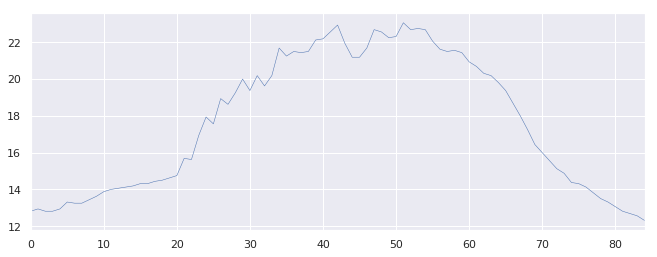

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(11, 4)});
jdata['temperature'].plot(linewidth=0.5, x='timestamp');

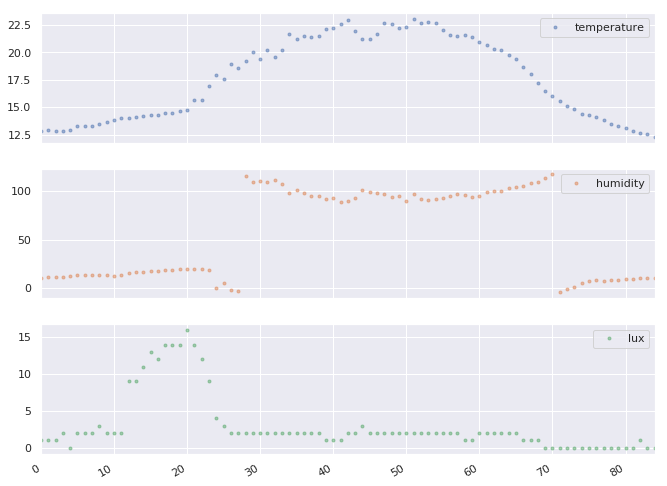

In [18]:
cols_plot = ['temperature', 'humidity', 'lux']
axes = jdata[cols_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)

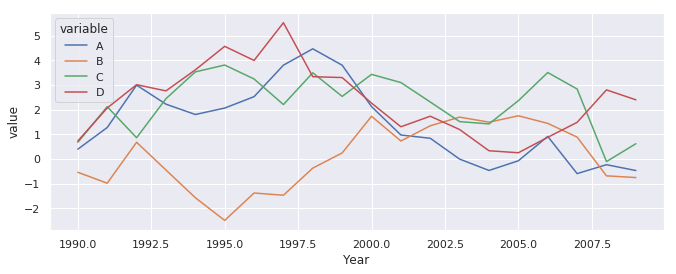

In [19]:
import pandas as pd;
import numpy as np;
import seaborn as sns;

num_rows = 20
years = list(range(1990, 1990 + num_rows))
data_preproc = pd.DataFrame({
    'Year': years, 
    'A': np.random.randn(num_rows).cumsum(),
    'B': np.random.randn(num_rows).cumsum(),
    'C': np.random.randn(num_rows).cumsum(),
    'D': np.random.randn(num_rows).cumsum()})

# A single plot with four lines, one per measurement type, is obtained with

sns.lineplot(x='Year', y='value', hue='variable', 
             data=pd.melt(data_preproc, ['Year']))


## https://stackabuse.com/reading-and-writing-json-files-in-python-with-pandas/

# First successful mjs data multiplot with timestamp on x-axis

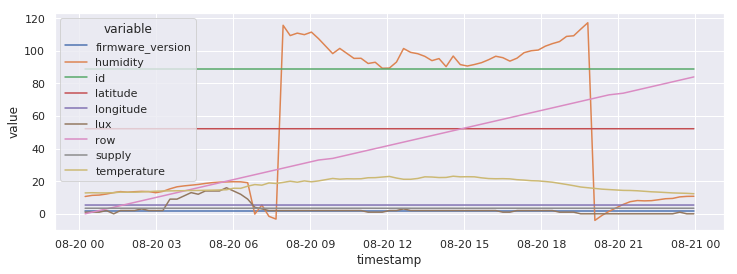

In [20]:
sns.set(rc={'figure.figsize':(12, 4)});
ax = sns.lineplot(x='timestamp', y='value', hue='variable', 
             data=pd.melt(jdata, ['timestamp']))

# Create data frame with selected columns

## https://seaborn.pydata.org/tutorial/aesthetics.html

In [21]:
plotdata = pd.DataFrame({
    'timestamp': jdata['timestamp'], 
    'temperature': jdata['temperature'],
    'humidity': jdata['humidity']})

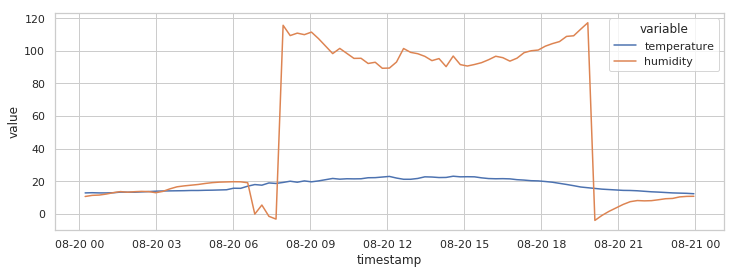

In [22]:
sns.set(rc={'figure.figsize':(12, 4)});
#sns.set_theme(style="darkgrid");
sns.set_theme(style="whitegrid");
ax = sns.lineplot(x='timestamp', y='value', hue='variable', 
             data=pd.melt(plotdata, ['timestamp']))

In [23]:
print('min: ', jdata['temperature'].min())
print('max: ', jdata['temperature'].max())

min:  12.3125
max:  23.0625


In [24]:
print('min: ', jdata['humidity'].min())
print('max: ', jdata['humidity'].max())

min:  -4.0625
max:  117.25


## Multiple y-axes

From: https://stackoverflow.com/questions/47591650/second-y-axis-time-series-seaborn

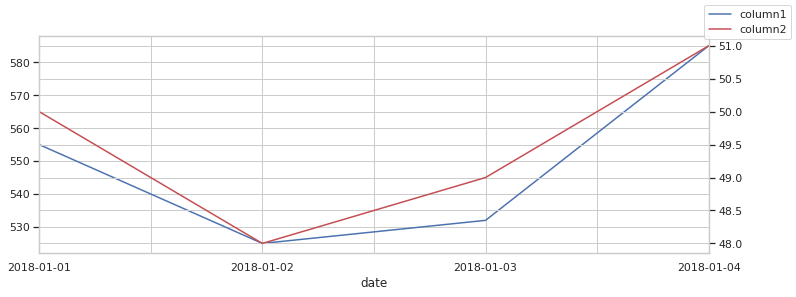

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame({"date": ["2018-01-01", "2018-01-02", "2018-01-03", "2018-01-04"],
                   "column1": [555,525,532,585], 
                   "column2": [50,48,49,51]})

ax = df.plot(x="date", y="column1", legend=False)
ax2 = ax.twinx()
df.plot(x="date", y="column2", ax=ax2, legend=False, color="r")
ax.figure.legend()
plt.show()

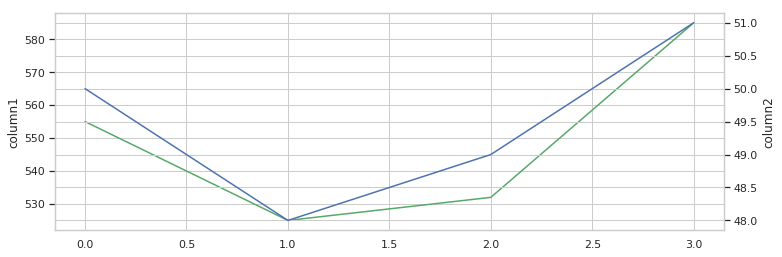

In [26]:
import matplotlib.pyplot as plt
sns.lineplot(data=df.column1, color="g")
ax2 = plt.twinx()
sns.lineplot(data=df.column2, color="b", ax=ax2)

From: https://stackoverflow.com/questions/61076714/seaborn-plotly-multiple-y-axes

/home/rogue/.anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/rogue/.anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/rogue/.anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


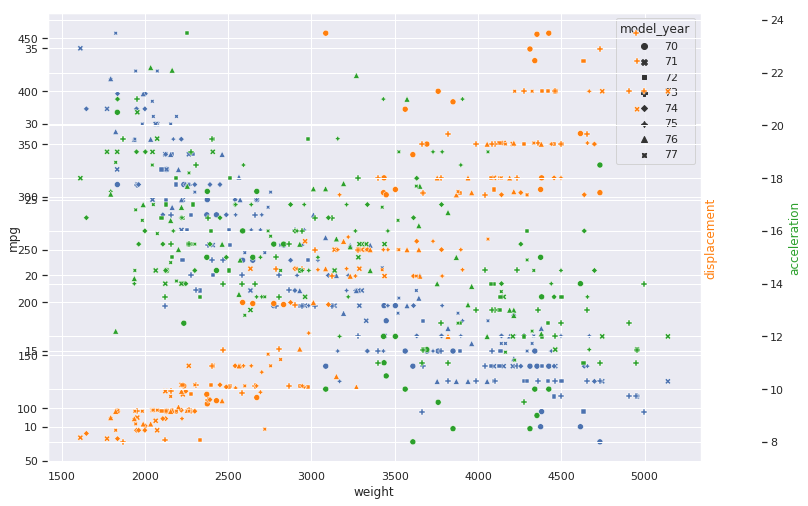

In [27]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import seaborn as sns

df=sns.load_dataset("mpg")
df=df.loc[df['model_year']<78]

show=['mpg','displacement','acceleration']

sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.scatterplot('weight',show[0],data=df.reset_index(),style='model_year') 
del show[0]
k=1
off=0
for i in show:
    a = plt.twinx()
    a=sns.scatterplot('weight',i,data=df.reset_index(),ax=a, color=list(mcolors.TABLEAU_COLORS)[k],legend=False,style='model_year')
    a.spines['right'].set_position(('outward', off))
    a.yaxis.label.set_color(list(mcolors.TABLEAU_COLORS)[k])
    k+=1
    off+=60


From: https://stackoverflow.com/questions/61076714/seaborn-plotly-multiple-y-axes

In [28]:
import seaborn as sns
import plotly.graph_objects as go

df=sns.load_dataset("mpg")

show=['mpg','displacement','acceleration']

mcolors=[
    '#1f77b4',  # muted blue
    '#ff7f0e',  # safety orange
    '#2ca02c',  # cooked asparagus green
    '#d62728',  # brick red
    '#9467bd',  # muted purple
    '#8c564b',  # chestnut brown
    '#e377c2',  # raspberry yogurt pink
    '#7f7f7f',  # middle gray
    '#bcbd22',  # curry yellow-green
    '#17becf'   # blue-teal
];


fig = go.Figure()
m=0
for k in df.model_year.unique():
    fig.add_trace(go.Scatter(
        x = df.loc[df.model_year == k]['weight'],
        y = df.loc[df.model_year == k][show[0]],
        name = str(k), 
        mode = 'markers',
        marker_symbol=m,
        marker_line_width=0,
        marker_size=6,
        marker_color=mcolors[0],
    ))
    m+=1

layout = {'xaxis':dict(
        domain=[0,0.7]
        ),
          'yaxis':dict(
            title=show[0],
            titlefont=dict(
                color=mcolors[0]
        ),
        tickfont=dict(
            color=mcolors[0]
        ),
          showgrid=False
          )}
n=2
for i in show[1::]:
    m=0
    for k in df.model_year.unique():
        fig.add_trace(go.Scatter(
            x = df.loc[df.model_year == k]['weight'],
            y = df.loc[df.model_year == k][i],
            name = str(k), 
            yaxis ='y'+str(n),
            mode = 'markers',
            marker_symbol=m,
            marker_line_width=0,
            marker_size=6,
            marker_color=mcolors[n],
            showlegend = False
        ))
        m+=1

    layout['yaxis'+str(n)] = dict(
        title=i,
        titlefont=dict(
            color=mcolors[n]
        ),
        tickfont=dict(
            color=mcolors[n]
            ),
        anchor="free",
        overlaying="y",
        side="right",
        position=(n)*0.08+0.55,
        showgrid=False,
    )
    n+=1

fig.update_layout(**layout)

fig.show()  

From: https://stackoverflow.com/questions/61830815/how-to-plot-a-multiple-line-plot-in-seaborn-using-specific-columns

In [29]:
df = pd.DataFrame([{'name': 'A', '2015': 99, '2016':98, '2017': '95', '2018':'99'}, {'name': 'B', '2015': 76, '2016':89, '2017': 83, '2018': 85}, {'name': 'C', '2015': 88, '2016':89, '2017': 91, '2018':91}])
df.set_index('name', inplace=True)
df

,2015,2016,2017,2018
name,,,,
A,99,98,95,99
B,76,89,83,85
C,88,89,91,91


In [30]:
import seaborn as sns
import pandas as pd


df = pd.DataFrame(
    [
        {"name": "A", "2015": 99, "2016": 98, "2017": 95, "2018": 99},
        {"name": "B", "2015": 76, "2016": 89, "2017": 83, "2018": 85},
        {"name": "C", "2015": 88, "2016": 89, "2017": 91, "2018": 91},
    ]
)

df.set_index("name", inplace=True)
tidy = df.stack().reset_index().rename(columns={"level_1": "year", 0: "values"})

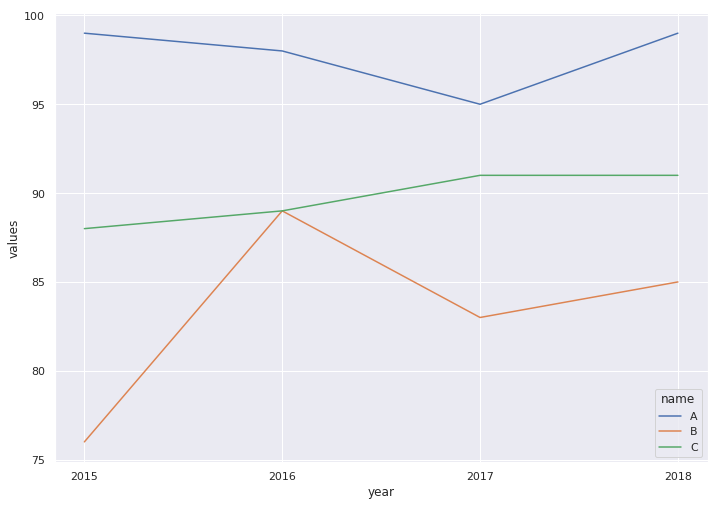

In [31]:
sns.lineplot(data=tidy, x="year", y="values", hue="name");

Filter out some years

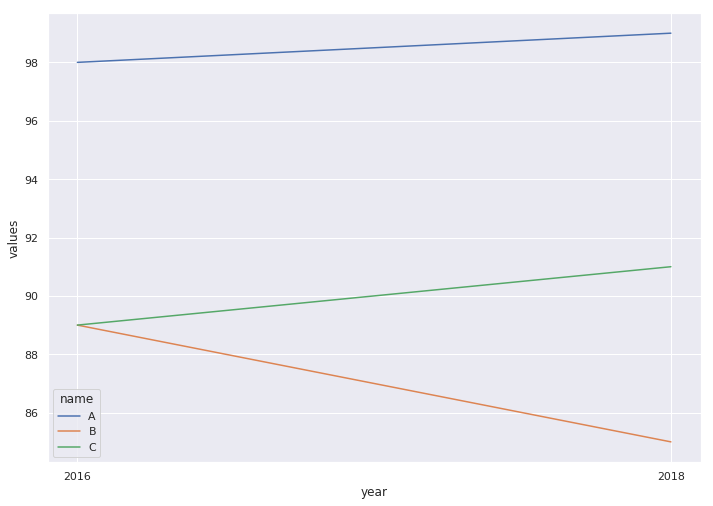

In [32]:
sns.lineplot(
    data=tidy[tidy["year"].isin(["2016", "2018"])], x="year", y="values", hue="name"
)

Rename DataFrame columns

From: https://stackoverflow.com/questions/11346283/renaming-column-names-in-pandas?rq=1

In [33]:
df = pd.DataFrame({'$a':[1,2], '$b': [10,20]})
df

,$a,$b
0,1,10
1,2,20


In [34]:
df.columns = ['a', 'b']
df

,a,b
0,1,10
1,2,20


In [35]:
df.rename(columns = {'b':'x'}, inplace = True)
df

,a,x
0,1,10
1,2,20


In [36]:
df.rename(columns = {'x':'B', 'a':'AA'}, inplace = True)
df

,AA,B
0,1,10
1,2,20


In [37]:
import numpy as np
import pandas as pd
import seaborn as sns
import folium
import webbrowser
from folium.plugins import HeatMap

import requests
import json
import math;



In [38]:

def remove(f):
  global lat, lon, temp, ids;
  lat = lat[f];
  lon = lon[f];
  temp = temp[f];
  ids = ids[f];


tfrom = {'y': 2021, 'm': 8, 'd': 20, 'H': 0, 'M': 0};
tto = {'y': 2021, 'm': 8, 'd': 21, 'H': 0, 'M': 0};

url = 'https://meetjestad.net/data/?type=sensors&format=json';
url = url + '&begin=%d-%d-%d,%d:%d&end=%d-%d-%d,%d:%d' % (tfrom['y'], tfrom['m'], tfrom['d'], tfrom['H'], tfrom['M'], tto['y'], tto['m'], tto['d'], tto['H'], tto['M']);
print(url);

r = requests.get(url);
#print(r.text);

#jsonData = json.loads(r.text);
#num = len(jsonData);
#temp = np.array(jsonData["temperature"][0:num])
#temp

print('--');
pdata = pd.io.json.read_json(r.text);
print(pdata);
num = len(pdata);
print('--');
lat = np.array(pdata["latitude"][0:num]);
lon = np.array(pdata["longitude"][0:num]);
temp = np.array(pdata["temperature"][0:num]);
ids = np.array(pdata["id"][0:num]);
print(lat);

# Filter out items with NaN (undefined) values.
remove(np.logical_not(np.isnan(lat)));
remove(np.logical_not(np.isnan(lon)));
remove(np.logical_not(np.isnan(temp)));

# thuis (89) latitude 52.204, longitude 5.38129
# amersfoort lb 52.216983, 5.341343, ro 52.130576, 5.448526
remove(lon >= 5.28129);
remove(lon <= 5.48129);
remove(lat >= 52.104);
remove(lat <= 52.304);

data1 = [[lat[i],lon[i],temp[i]] for i in range(len(lat))];



https://meetjestad.net/data/?type=sensors&format=json&begin=2021-8-20,0:0&end=2021-8-21,0:0
--
       battery                                              extra  \
0          NaN                                                NaN   
1          NaN                                                NaN   
2          NaN                                                NaN   
3          NaN                                                NaN   
4          NaN                                                NaN   
5          NaN                                                NaN   
6         4.12                                            [52, 6]   
7          NaN                                                NaN   
8          NaN                                                NaN   
9         4.44                                            [12, 0]   
10         NaN                                                NaN   
11        4.06                  [1629417650, 93421, 306, 9, 6, 0]   
12      

In [39]:

# auto center to the middle of the lat/lon
clat = (np.min(lat) + np.max(lat)) / 2;
clon = (np.min(lon) + np.max(lon)) / 2;
print('center:', clat, clon);
map_osm = folium.Map(location = [clat,clon], tiles = 'Stamen Terrain' \
  , zoom_start = 12, control_scale = True)
HeatMap(data1).add_to(map_osm)

map_osm


center: 52.17125 5.383285


From: https://python-visualization.github.io/folium/quickstart.html#Markers

In [40]:
import folium;

m = folium.Map(location=[45.5236, -122.6750], tiles="Stamen Toner", zoom_start=13)

folium.Circle(
    radius=100,
    location=[45.5244, -122.6699],
    popup="The Waterfront",
    color="crimson",
    fill=True,
    fill_color="#00ffff",
    fill_opacity=1,
).add_to(m)

folium.Circle(
    radius=200,
    location=[45.5144, -122.6699],
    popup="The Waterfront",
    color="crimson",
    fill=False,
).add_to(m)

folium.CircleMarker(
    location=[45.5215, -122.6261],
    radius=50,
    popup="Laurelhurst Park",
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
).add_to(m)


m

In [41]:
def getColorRainbow(n, maxn):
  r = 0;
  g = 0;
  b = 0;

  # Scale n to [0, 6 * 256>
  n = (float(n) / float(maxn)) * (256 * 6);
  n = int(n) % (256 * 6);

  if n >= 5 * 256:
    r = 0;
    g = 255 - (n - 5 * 256);
    b = 255;
  elif n >= 4 * 256:
    r = 0;
    g = 255;
    b = n - 4 * 256;
  elif n >= 3 * 256:
    r = 255 - (n - 3 * 256);
    g = 255;
    b = 0;
  elif n >= 2 * 256:
    r = 255;
    g = n - 2 * 256;
    b = 0;
  elif n >= 1 * 256:
    r = 255;
    g = 0;
    b = 255 - (n - 1 * 256);
  elif n >= 0 * 256:
    r = n - 0 * 256;
    g = 0;
    b = 255;

  #print("color: #%02x%02x%02x" % (r, g, b));
  #return {"r": r, "g": g, "b": b};
  return "#%02x%02x%02x" % (r, g, b);


In [42]:
## test getColorRainbow
maxn = 6 * 256;
print(getColorRainbow(100, maxn));
print(getColorRainbow(200, maxn));
print(getColorRainbow(300, maxn));
print(getColorRainbow(400, maxn));
print(getColorRainbow(500, maxn));

maxn /= 2;
print(getColorRainbow(50, maxn));
print(getColorRainbow(100, maxn));
print(getColorRainbow(150, maxn));
print(getColorRainbow(200, maxn));
print(getColorRainbow(250, maxn));

for i in range(0, 40):
  print(getColorRainbow(i, 40));

#6400ff
#c800ff
#ff00d3
#ff006f
#ff000b
#6400ff
#c800ff
#ff00d3
#ff006f
#ff000b
#0000ff
#2600ff
#4c00ff
#7300ff
#9900ff
#c000ff
#e600ff
#ff00f3
#ff00cc
#ff00a6
#ff007f
#ff0059
#ff0033
#ff000c
#ff1900
#ff4000
#ff6600
#ff8c00
#ffb300
#ffd900
#ffff00
#d9ff00
#b3ff00
#8cff00
#66ff00
#3fff00
#19ff00
#00ff0c
#00ff33
#00ff59
#00ff80
#00ffa6
#00ffcc
#00fff3
#00e6ff
#00bfff
#0099ff
#0073ff
#004cff
#0026ff


In [43]:
m = folium.Map(location=[45.5236, -122.6750], tiles="Stamen Toner", zoom_start=13)

for i in range(0, 40):
  c = getColorRainbow(i, 40);
  folium.CircleMarker(
    radius=100,
    location=[45.5236, -122.6750 + i / 100],
    color="#000000",
    weight=0,
    fill=True,
    fill_color=c,
    #fill_color="#ffff00",
    fill_opacity=1,
  ).add_to(m)
m

In [44]:
def getColorRedBlue(n):

  nmin = 14.0;
  nmax = 26.0;

  if n < nmin:
    n = nmin;
  if n > nmax:
    n = nmax;
  n = float(n);

  # Scale n to [0, 256>
  n = (n - nmin) * 255.0 / (nmax - nmin);
  n = int(n);

  r = n;
  b = 0;
  g = 255 - n;

  c = "#%02x%02x%02x" % (r, g, b);
  #print("color: %d  %s" % (n, c));
  return c;


In [45]:

# auto center to the middle of the lat/lon
clat = (np.min(lat) + np.max(lat)) / 2;
clon = (np.min(lon) + np.max(lon)) / 2;
print('center:', clat, clon);
map_osm = folium.Map(location = [clat,clon], tiles = 'Stamen Terrain' \
  , zoom_start = 12, control_scale = True)
tmin = temp.min();
tmax = temp.max();
print("temp %.1f - %.1f" % (tmin, tmax));
for i in range(0, len(lat)):
  if temp[i] < -2:
    continue;
  c = getColorRedBlue(temp[i]);
  folium.Circle(
    radius=30,
    location=[lat[i], lon[i]],
    color="#000000",
    weight=0,
    fill=True,
    fill_color=c,
    #fill_color="#ffff00",
    fill_opacity=1,
    popup="t=%.1f  id=%d" % (temp[i], ids[i]),
  ).add_to(map_osm)

map_osm


center: 52.17125 5.383285
temp -26.0 - 25.5


From: https://www.linkedin.com/pulse/mapping-last-30-days-earthquake-using-python-udit-agarwal

bash> export PROJ_LIB=~/.anaconda3/share/proj/

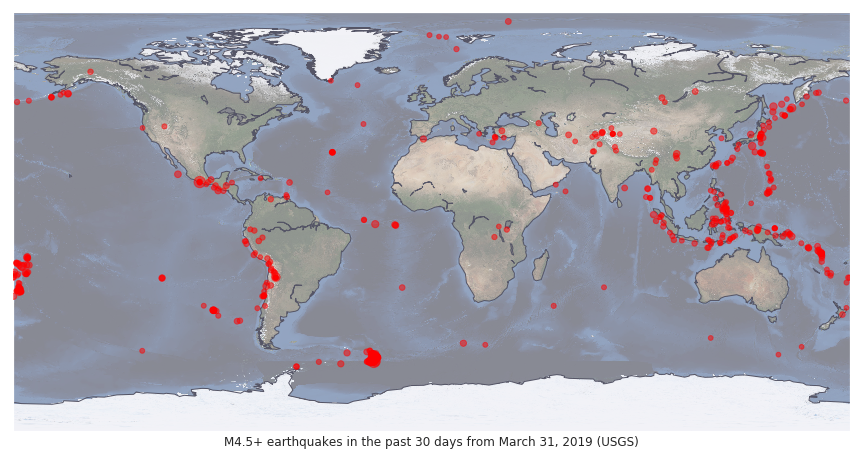

In [46]:
#importing all the required libraries for requesting the data
import requests
from csv import DictReader
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

#URL for USGS for Earthquake data
DATA_URL = 'https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/4.5_month.csv'
print("Downloading", DATA_URL)
resp = requests.get(DATA_URL)
quakes = list(DictReader(resp.text.splitlines()))
mags = [2 ** float(q['mag']) for q in quakes]

#converting the data into a python pandas dataframe for viewing it
quakes1=pd.DataFrame(quakes)

# ...avoiding numpy/pandas Array() for now, and can't care enough to do this less awkwardly...
lngs = [float(q['longitude']) for q in quakes]
lats = [float(q['latitude']) for q in quakes]

#plotting the map here by using the scatterplot for indicating the countries
plt.figure(figsize=(15, 9))
earth = Basemap()
earth.bluemarble(alpha=0.42)
earth.drawcoastlines(color='#555566', linewidth=1)
plt.scatter(lngs, lats, mags, 
            c='red',alpha=0.5, zorder=10)
plt.xlabel("M4.5+ earthquakes in the past 30 days from March 31, 2019 (USGS)")
plt.savefig('usgs-4.5quakes-last30days.png', dpi=350)



## Jupyter Notebook ##

### Markdown / formatting ###
    
https://ingeh.medium.com/markdown-for-jupyter-notebooks-cheatsheet-386c05aeebed

https://www.ibm.com/docs/en/db2-event-store/2.0.0?topic=notebooks-markdown-jupyter-cheatsheet


## Python Data Analysis and Visualization 

https://www.educative.io/courses/python-data-analysis-and-visualization



## Python Pandas

[Pandas Tutorial: DataFrames in Python](https://www.datacamp.com/community/tutorials/pandas-tutorial-dataframe-python)

[10 minutes to Pandas](https://pandas.pydata.org/pandas-docs/stable/user_guide/10min.html) -
[Intro to data structures](https://pandas.pydata.org/pandas-docs/stable/user_guide/dsintro.html)


## Data engineering

https://medium.com/@rchang/a-beginners-guide-to-data-engineering-part-i-4227c5c457d7

collect, move/store, aggregate/label, explore/transform, move/store, collect

https://medium.com/@rchang/a-beginners-guide-to-data-engineering-part-ii-47c4e7cbda71

https://medium.com/@rchang/a-beginners-guide-to-data-engineering-the-series-finale-2cc92ff14b0



## Data analysis

  - Quantitative data analysis
  - Qualitative data analysis
  
  
    Step One: Ask The Right Questions. So you're ready to get started. ...
    Step Two: Data Collection. This brings us to the next step: data collection. ...
    Step Four: Analyzing The Data. ...
    Step Three: Data Cleaning. ...
    Repeat steps Four and Three until ready
    Step Five: Interpreting The Results.
  
  
  https://www.educative.io/blog/python-pandas-tutorial
  
  

## Data processing ##

  - collection
  - preparation
  - input
  - processing
  - output & interpretation
  - storage


## Load data ##

In [84]:
sensor = 89;

# dates: [<year>, <month>, <day>, <hour>, <minute>]
dateFrom = [2021, 8, 20, 0, 0];
dateTo = [2021, 8, 21, 0, 0];

# 'https://meetjestad.net/data/?type=sensors&format=json&ids=89&begin=2021-8-20,0:0&end=2021-8-21,0:0'
url = 'https://meetjestad.net/data/?type=sensors&format=json&ids=%d&begin=%d-%d-%d,%d:%d&end=%d-%d-%d,%d:%d';
url = url % (sensor, dateFrom[0], dateFrom[1], dateFrom[2], dateFrom[3], dateFrom[4], \
  dateTo[0], dateTo[1], dateTo[2], dateTo[3], dateTo[4]);

jdata = pd.read_json(url, convert_dates=True)


In [92]:
print('length: ', len(jdata));
print(jdata.info());
print(jdata.columns)
print(jdata.head())

length:  85
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 10 columns):
firmware_version    85 non-null int64
humidity            85 non-null float64
id                  85 non-null int64
latitude            85 non-null float64
longitude           85 non-null float64
lux                 85 non-null int64
row                 85 non-null int64
supply              85 non-null float64
temperature         85 non-null float64
timestamp           85 non-null datetime64[ns]
dtypes: datetime64[ns](1), float64(5), int64(4)
memory usage: 6.7 KB
None
Index(['firmware_version', 'humidity', 'id', 'latitude', 'longitude', 'lux',
       'row', 'supply', 'temperature', 'timestamp'],
      dtype='object')
   firmware_version  humidity  id  latitude  longitude  lux  row  supply  \
0                 2   10.6250  89   52.2041    5.38104    1    0    3.42   
1                 2   11.3125  89   52.2041    5.38104    1    1    3.42   
2                 2   11.5000  8

## Explore data ##

https://www.geodose.com/2019/09/creating-idw-interpolation-from-scratch-python.html

https://www.geodose.com/2019/09/3d-terrain-modelling-in-python.html

Inverse Distance Weighted (IDW) Interpolation

https://stackoverflow.com/questions/3104781/inverse-distance-weighted-idw-interpolation-with-python

http://introtopython.org/visualization_earthquakes.html


12.3125
23.0625


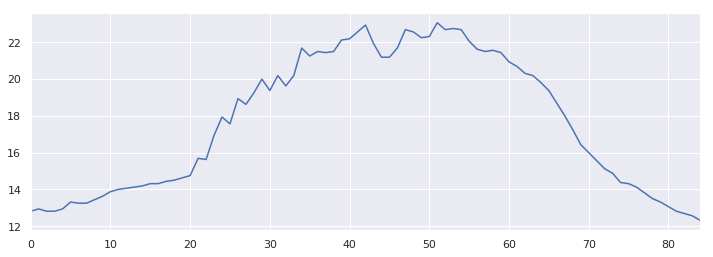

In [53]:
print(jdata['temperature'].min());
print(jdata['temperature'].max());
jdata['temperature'].plot();

-4.0625
117.25


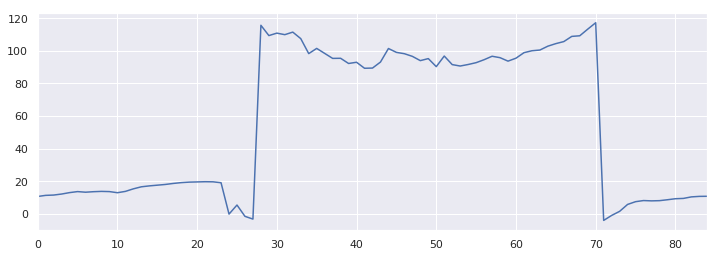

In [54]:
print(jdata['humidity'].min())
print(jdata['humidity'].max())
jdata['humidity'].plot();

In [ ]:
jdata['temperature'].plot();

### Create new DataFrame from some of the columns

In [95]:
plotdata = pd.DataFrame({
    'timestamp': jdata['timestamp'], 
    'temperature': jdata['temperature'],
    'humidity': jdata['humidity']})

plotdata1 = pd.DataFrame(df, columns=['timestamp', 'temperature', 'humidity'])
print(plotdata1.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 3 columns):
timestamp      0 non-null float64
temperature    0 non-null float64
humidity       0 non-null float64
dtypes: float64(3)
memory usage: 128.0 bytes
None


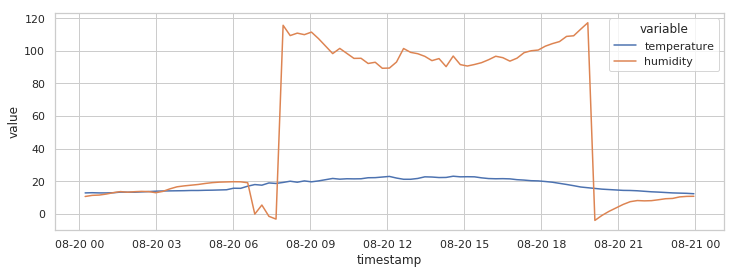

In [56]:
sns.set(rc={'figure.figsize':(12, 4)});
#sns.set_theme(style="darkgrid");
sns.set_theme(style="whitegrid");
ax = sns.lineplot(x='timestamp', y='value', hue='variable', 
             data=pd.melt(plotdata, ['timestamp']))

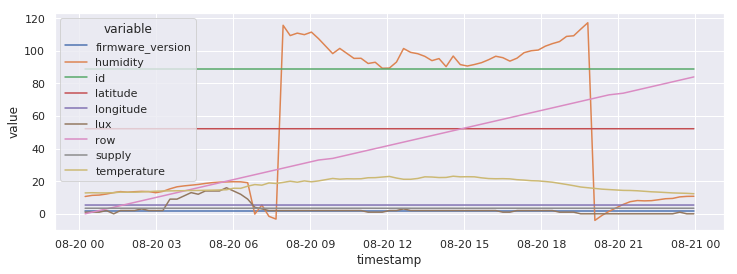

In [47]:
sns.set(rc={'figure.figsize':(12, 4)});
ax = sns.lineplot(x='timestamp', y='value', hue='variable', 
             data=pd.melt(jdata, ['timestamp']))

https://stackoverflow.com/questions/3104781/inverse-distance-weighted-idw-interpolation-with-python

/home/rogue/.anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning:

divide by zero encountered in true_divide

/home/rogue/.anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:47: RuntimeWarning:

invalid value encountered in true_divide



(2500,)


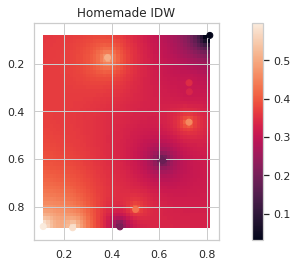

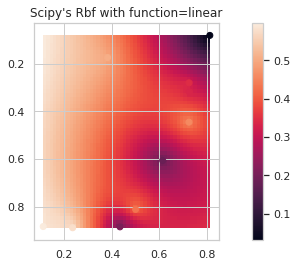

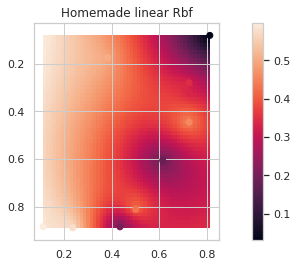

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import Rbf

def _main():
    # Setup: Generate data...
    n = 10
    nx, ny = 50, 50
    x, y, z = map(np.random.random, [n, n, n])
    xi = np.linspace(x.min(), x.max(), nx)
    yi = np.linspace(y.min(), y.max(), ny)
    xi, yi = np.meshgrid(xi, yi)
    xi, yi = xi.flatten(), yi.flatten()

    # Calculate IDW
    grid1 = simple_idw(x,y,z,xi,yi)
    grid1 = grid1.reshape((ny, nx))

    # Calculate scipy's RBF
    grid2 = scipy_idw(x,y,z,xi,yi)
    grid2 = grid2.reshape((ny, nx))

    grid3 = linear_rbf(x,y,z,xi,yi)
    print(grid3.shape)
    grid3 = grid3.reshape((ny, nx))


    # Comparisons...
    plot(x,y,z,grid1)
    plt.title('Homemade IDW')

    plot(x,y,z,grid2)
    plt.title("Scipy's Rbf with function=linear")

    plot(x,y,z,grid3)
    plt.title('Homemade linear Rbf')

    plt.show()

def simple_idw(x, y, z, xi, yi):
    dist = distance_matrix(x,y, xi,yi)

    # In IDW, weights are 1 / distance
    weights = 1.0 / dist

    # Make weights sum to one
    weights /= weights.sum(axis=0)

    # Multiply the weights for each interpolated point by all observed Z-values
    zi = np.dot(weights.T, z)
    return zi

def linear_rbf(x, y, z, xi, yi):
    dist = distance_matrix(x,y, xi,yi)

    # Mutual pariwise distances between observations
    internal_dist = distance_matrix(x,y, x,y)

    # Now solve for the weights such that mistfit at the observations is minimized
    weights = np.linalg.solve(internal_dist, z)

    # Multiply the weights for each interpolated point by the distances
    zi =  np.dot(dist.T, weights)
    return zi


def scipy_idw(x, y, z, xi, yi):
    interp = Rbf(x, y, z, function='linear')
    return interp(xi, yi)

def distance_matrix(x0, y0, x1, y1):
    obs = np.vstack((x0, y0)).T
    interp = np.vstack((x1, y1)).T

    # Make a distance matrix between pairwise observations
    # Note: from <http://stackoverflow.com/questions/1871536>
    # (Yay for ufuncs!)
    d0 = np.subtract.outer(obs[:,0], interp[:,0])
    d1 = np.subtract.outer(obs[:,1], interp[:,1])

    return np.hypot(d0, d1)


def plot(x,y,z,grid):
    plt.figure()
    plt.imshow(grid, extent=(x.min(), x.max(), y.max(), y.min()))
    #plt.hold(True)
    plt.scatter(x,y,c=z)
    plt.colorbar()

#if __name__ == '__main__':
#    main()
_main()


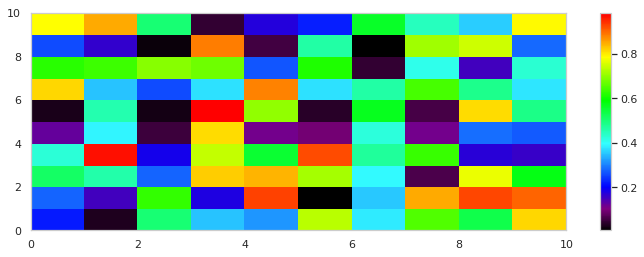

In [70]:
# https://stackoverflow.com/questions/25891614/how-to-generate-a-new-rainbow-colormap-using-matplotlib

import matplotlib
from matplotlib import pyplot as plt
import numpy as np

cdict = {'red': ((0.0, 0.0, 0.0),
                 (0.1, 0.5, 0.5),
                 (0.2, 0.0, 0.0),
                 (0.4, 0.2, 0.2),
                 (0.6, 0.0, 0.0),
                 (0.8, 1.0, 1.0),
                 (1.0, 1.0, 1.0)),
        'green':((0.0, 0.0, 0.0),
                 (0.1, 0.0, 0.0),
                 (0.2, 0.0, 0.0),
                 (0.4, 1.0, 1.0),
                 (0.6, 1.0, 1.0),
                 (0.8, 1.0, 1.0),
                 (1.0, 0.0, 0.0)),
        'blue': ((0.0, 0.0, 0.0),
                 (0.1, 0.5, 0.5),
                 (0.2, 1.0, 1.0),
                 (0.4, 1.0, 1.0),
                 (0.6, 0.0, 0.0),
                 (0.8, 0.0, 0.0),
                 (1.0, 0.0, 0.0))}

my_cmap = matplotlib.colors.LinearSegmentedColormap('my_colormap',cdict,256)
plt.pcolor(np.random.rand(10,10),cmap=my_cmap)
plt.colorbar()
plt.show()

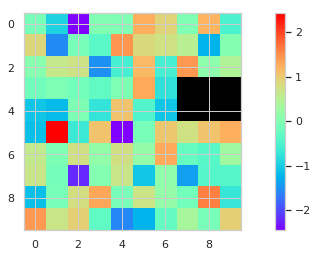

In [71]:
# https://stackoverflow.com/questions/25432654/how-to-create-matplotlib-colormap-that-treats-one-value-specially

import matplotlib.pyplot as plt
import numpy as np

cmap = plt.get_cmap('rainbow')
cmap.set_bad('black')

data = np.random.normal(0, 1, (10, 10))
data[3:5, 7:] = 0

data = np.ma.masked_equal(data, 0)

fig, ax = plt.subplots()
im = ax.imshow(data, interpolation='nearest', cmap=cmap)
fig.colorbar(im)
plt.show()

https://stackoverflow.com/questions/16400241/how-to-redefine-a-color-for-a-specific-value-in-a-matplotlib-colormap

List of colormap name:
https://matplotlib.org/stable/tutorials/colors/colormaps.html


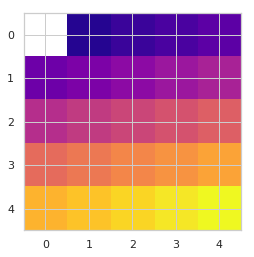

In [77]:
# https://stackoverflow.com/questions/16400241/how-to-redefine-a-color-for-a-specific-value-in-a-matplotlib-colormap

import numpy as np
import matplotlib.pyplot as plt

my_cmap = matplotlib.cm.get_cmap('plasma')
my_cmap.set_under('w')
fig, ax = plt.subplots()
im = ax.imshow(np.arange(25).reshape(5, 5),
       interpolation='none',
       cmap=my_cmap,
       vmin=.001)

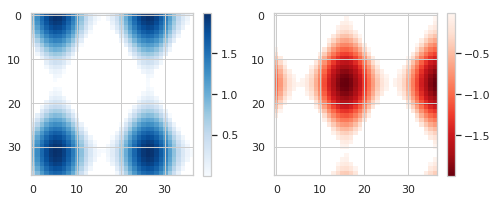

In [74]:
# https://matplotlib.org/2.0.2/examples/api/colorbar_basics.html
# https://matplotlib.org/stable/tutorials/colors/colormaps.html

import numpy as np
import matplotlib.pyplot as plt

# setup some generic data
N = 37
x, y = np.mgrid[:N, :N]
Z = (np.cos(x*0.2) + np.sin(y*0.3))

# mask out the negative and positve values, respectively
Zpos = np.ma.masked_less(Z, 0)
Zneg = np.ma.masked_greater(Z, 0)

fig, (ax1, ax2) = plt.subplots(figsize=(8, 3), ncols=2)

# plot just the positive data and save the
# color "mappable" object returned by ax1.imshow
pos = ax1.imshow(Zpos, cmap='Blues', interpolation='none')

# add the colorbar using the figure's method,
# telling which mappable we're talking about and
# which axes object it should be near
fig.colorbar(pos, ax=ax1)

# repeat everything above for the the negative data
neg = ax2.imshow(Zneg, cmap='Reds_r', interpolation='none')
fig.colorbar(neg, ax=ax2)

plt.show()

https://matplotlib.org/stable/gallery/images_contours_and_fields/image_demo.html

In [79]:
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.cbook as cbook
from matplotlib.path import Path
from matplotlib.patches import PathPatch


# Fixing random state for reproducibility
np.random.seed(19680801)


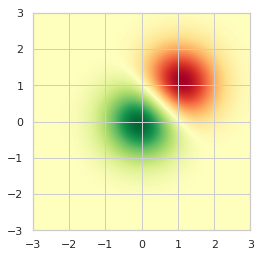

In [80]:
delta = 0.025
x = y = np.arange(-3.0, 3.0, delta)
X, Y = np.meshgrid(x, y)
Z1 = np.exp(-X**2 - Y**2)
Z2 = np.exp(-(X - 1)**2 - (Y - 1)**2)
Z = (Z1 - Z2) * 2

fig, ax = plt.subplots()
im = ax.imshow(Z, interpolation='bilinear', cmap=cm.RdYlGn,
               origin='lower', extent=[-3, 3, -3, 3],
               vmax=abs(Z).max(), vmin=-abs(Z).max())

plt.show()

https://www.geeksforgeeks.org/matplotlib-pyplot-imshow-in-python/

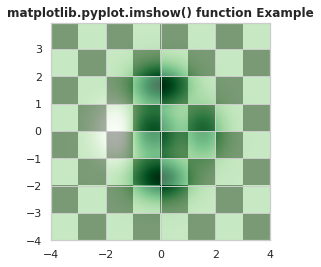

In [81]:
# Implementation of matplotlib function
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm
      
dx, dy = 0.015, 0.05
x = np.arange(-4.0, 4.0, dx)
y = np.arange(-4.0, 4.0, dy)
X, Y = np.meshgrid(x, y)
   
extent = np.min(x), np.max(x), np.min(y), np.max(y)
   
Z1 = np.add.outer(range(8), range(8)) % 2
plt.imshow(Z1, cmap ="binary_r", interpolation ='nearest',
                               extent = extent, alpha = 1)
   
def geeks(x, y):
    return (1 - x / 2 + x**5 + y**6) * np.exp(-(x**2 + y**2))
   
Z2 = geeks(X, Y)
   
plt.imshow(Z2, cmap ="Greens", alpha = 0.7, 
           interpolation ='bilinear', extent = extent)
  
plt.title('matplotlib.pyplot.imshow() function Example', 
                                     fontweight ="bold")
plt.show()